In [1]:
import sys
sys.path.append('../')

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

import hvplot.xarray
import hvplot
import cmocean

import matplotlib as mpl

hvplot.output(widget_location='bottom')

from helpers_mom6.collection_of_experiments import CollectionOfExperiments
from helpers_mom6.computational_tools import remesh, select_LatLon, Lk_error, x_coord, y_coord, gaussian_remesh
from helpers.plot_helpers import *
from helpers.selectors import *

import warnings
warnings.filterwarnings("ignore")


%load_ext autoreload
%autoreload 3

In [2]:
ann_zos = xr.open_dataset('/scratch/aa9537/OM5_025_b04/ZB_ANN_Cs_0.01/ocean_daily.19580101-19691231.zos.nc', chunks={'time':1}).zos
ann_ssu = xr.open_dataset('/scratch/aa9537/OM5_025_b04/ZB_ANN_Cs_0.01/ocean_daily.19580101-19691231.ssu.nc', chunks={'time':1}).ssu
ann_ssv = xr.open_dataset('/scratch/aa9537/OM5_025_b04/ZB_ANN_Cs_0.01/ocean_daily.19580101-19691231.ssv.nc', chunks={'time':1}).ssv

In [3]:
om5_zos = xr.open_mfdataset('/scratch/aa9537/OM5_025_b04/base/*zos.nc', chunks={'time':1}).zos
om5_ssu = xr.open_mfdataset('/scratch/aa9537/OM5_025_b04/base/*ssu.nc', chunks={'time':1}).ssu
om5_ssv = xr.open_mfdataset('/scratch/aa9537/OM5_025_b04/base/*ssv.nc', chunks={'time':1}).ssv

In [168]:
from xgcm import Grid
ann_greene = xr.open_mfdataset('/scratch/pp2681/mom6/global_simulations/May16-Cs-0.01/output/ocean_daily*', chunks={'time':1})
greene_static = ann_greene[['xh', 'yh', 'xq', 'yq']]
grid = Grid(greene_static, coords={
        'X': {'center': 'xh', 'outer': 'xq'},
        'Y': {'center': 'yh', 'outer': 'yq'}
        },
        periodic = 'X'
        )
R = 6.371e+6 # Earth radius in metres|
deg_to_rad = np.pi / 180 # degrees to radians factor
greene_static['dxCu'] = grid.diff(greene_static.xh, 'X')
greene_static['dxCu'][0] = greene_static['dxCu'][1] # Simple B.C.
greene_static['dxCu'][-1] = greene_static['dxCu'][-2]
greene_static['dxCu'] = greene_static['dxCu'] * R * deg_to_rad * np.cos(greene_static.yh * deg_to_rad)
greene_static['dyCv'] = grid.diff(greene_static.yh, 'Y')
greene_static['dyCv'][0] = greene_static['dyCv'][1]
greene_static['dyCv'][-1] = greene_static['dyCv'][-2]
greene_static['dyCv'] = greene_static['dyCv'] * R * deg_to_rad

In [4]:
om5_static = xr.open_dataset('/scratch/aa9537/OM5_025_b04/ocean_daily.static.nc')

In [223]:
obs_zos = xr.open_dataset('/vast/pp2681/altimetry_Copernicus.nc', chunks={'time':1}).rename({'longitude': 'xh', 'latitude': 'yh'}).adt
xh = obs_zos['xh']
xh = xr.where(xh>60, xh-360,xh)
obs_zos['xh'] = xh
obs_zos = obs_zos.sortby('xh')

obs_static = xr.Dataset()
obs_static['xh'] = obs_zos.xh
obs_static['yh'] = obs_zos.yh
res = 0.25
obs_static['xq'] = (obs_static['xh'] + res/2).rename({'xh': 'xq'})
obs_static['yq'] = (obs_static['yh'] + res/2).rename({'yh': 'yq'})
R = 6.371e+6 # Earth radius in metres|
deg_to_rad = np.pi / 180 # degrees to radians factor
obs_static['dxCu'] = res * R * deg_to_rad * np.cos(obs_static.yh * deg_to_rad)
obs_static['dyCv'] = res * R * deg_to_rad

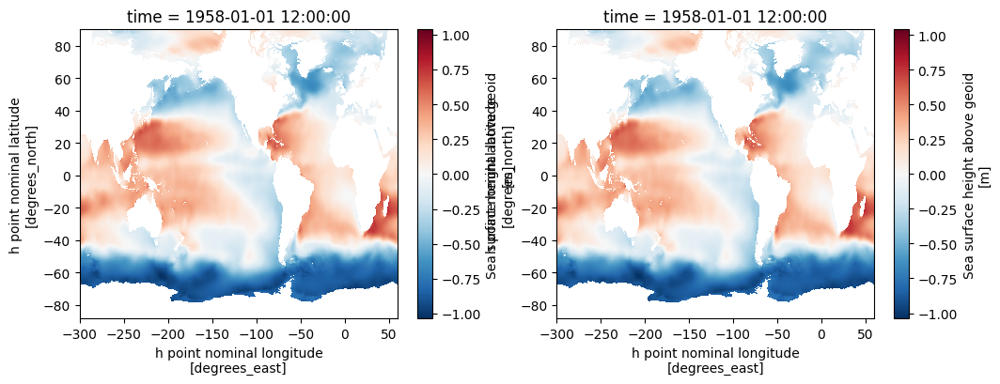

In [5]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
om5_zos.isel(time=0).plot()
plt.subplot(1,2,2)
ann_zos.isel(time=0).plot()

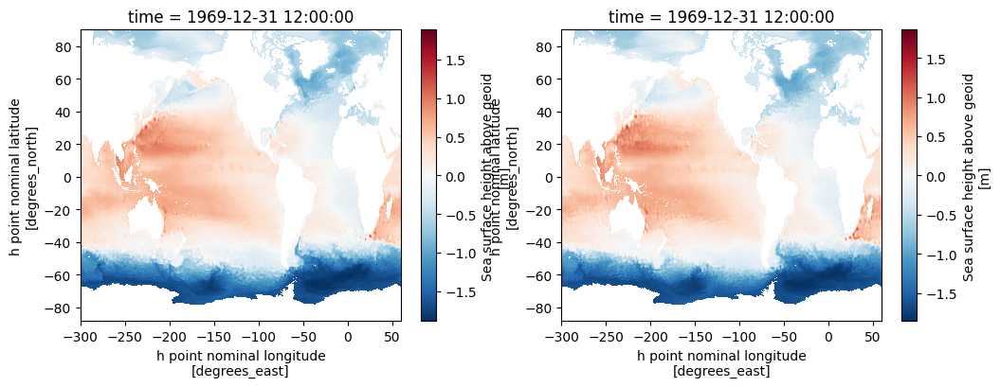

In [6]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
om5_zos.isel(time=4382).plot()
plt.subplot(1,2,2)
ann_zos.isel(time=4382).plot()

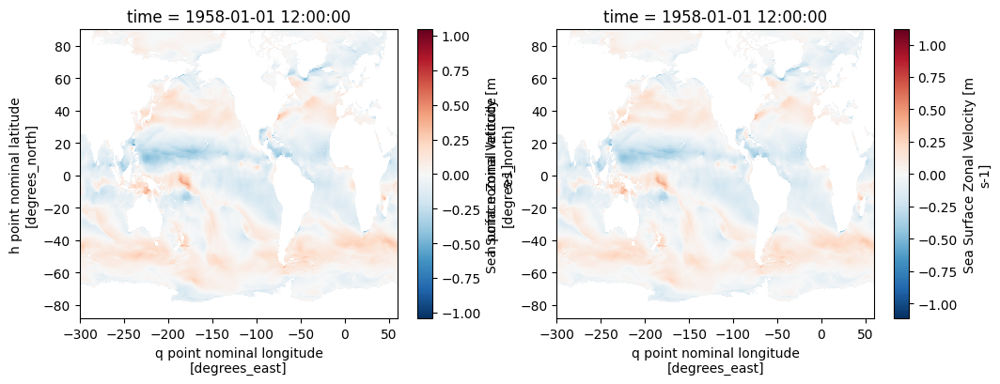

In [7]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
om5_ssu.isel(time=0).plot()
plt.subplot(1,2,2)
ann_ssu.isel(time=0).plot()

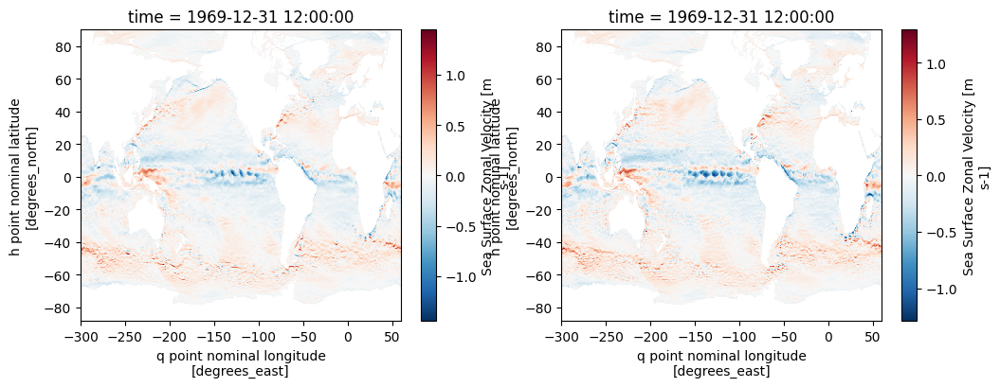

In [8]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
om5_ssu.isel(time=4382).plot()
plt.subplot(1,2,2)
ann_ssu.isel(time=4382).plot()

In [49]:
from xgcm import Grid
def geostrophic_velocity(zos, static, outer='outer'):
    grid = Grid(static, coords={
            'X': {'center': 'xh', outer: 'xq'},
            'Y': {'center': 'yh', outer: 'yq'}
            },
            periodic = 'X'
            )

    # Coriolis parameter
    Omega = 7.2921e-5
    deg_to_rad = np.pi / 180 # degrees to radians factor
    fh = 2 * Omega * np.sin(static.yh * deg_to_rad)
    fq = 2 * Omega * np.sin(static.yq * deg_to_rad)

    g = 9.8
    
    # Gradient of the SSH
    hx = grid.diff(zos, 'X') / static.dxCu
    hy = grid.diff(zos, 'Y') / static.dyCv
    
    u = grid.interp(- g / fq * hy, 'Y')
    v = grid.interp(+ g / fh * hx, 'X')
    return u, v, np.sqrt(u**2+v**2)

In [50]:
def velocity(ssu, ssv, static, outer='outer'):
    grid = Grid(static, coords={
            'X': {'center': 'xh', outer: 'xq'},
            'Y': {'center': 'yh', outer: 'yq'}
            },
            periodic = 'X'
            )

    u = grid.interp(ssu, 'X')
    v = grid.interp(ssv, 'Y')
    return u, v, np.sqrt(u**2+v**2)

In [224]:
om5_vg = geostrophic_velocity(om5_zos, om5_static)
om5_v = velocity(om5_ssu, om5_ssv, om5_static)
ann_vg = geostrophic_velocity(ann_zos, om5_static)
ann_v = velocity(ann_ssu, ann_ssv, om5_static)
obs_vg = geostrophic_velocity(obs_zos, obs_static, outer='right')
ann_greene_vg = geostrophic_velocity(ann_greene.zos, greene_static)
ann_greene_v = velocity(ann_greene.ssu,ann_greene.ssv, greene_static)

Correlation: 0.9876490629454735
Relative Error: 0.1829568590605061
R2 =  0.9709106657676229
R2 max =  0.975404947073511
Optinal scaling: 1.0809378409465602
Nans [test/control]: [21110, 21056]


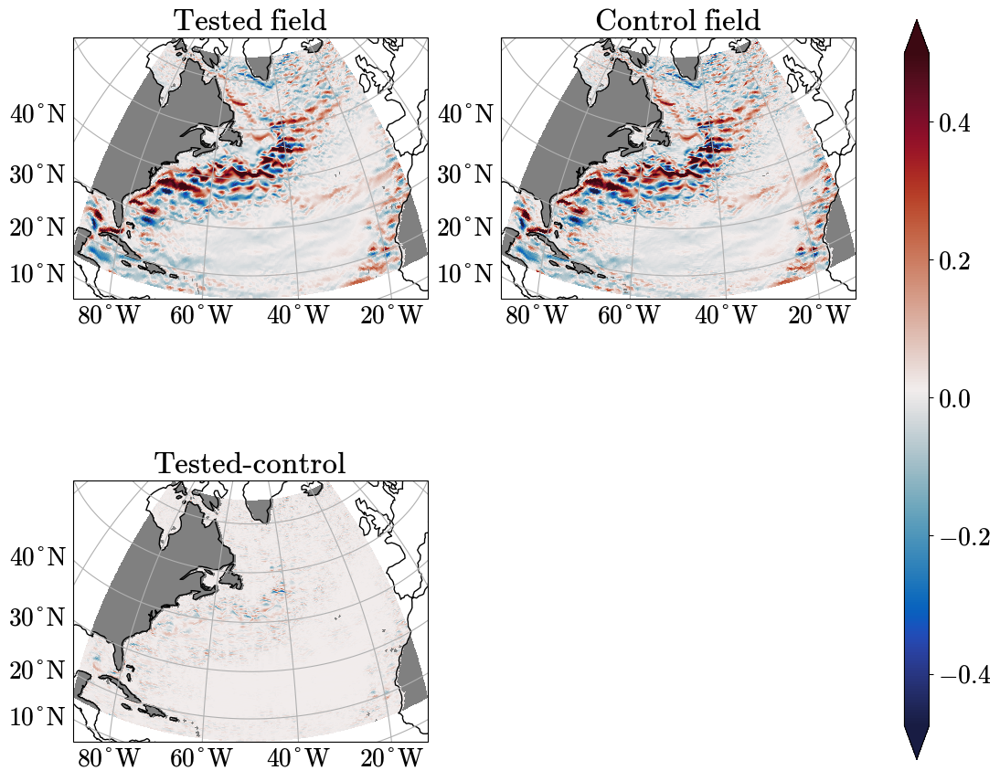

In [174]:
compare(ann_greene_vg[0].isel(time=364), ann_greene_v[0].isel(time=364))

Correlation: 0.9877403445631447
Relative Error: 0.18872614617561745
R2 =  0.9693798901929803
R2 max =  0.9754691969226835
Optinal scaling: 1.0949293849741484
Nans [test/control]: [21056, 21110]


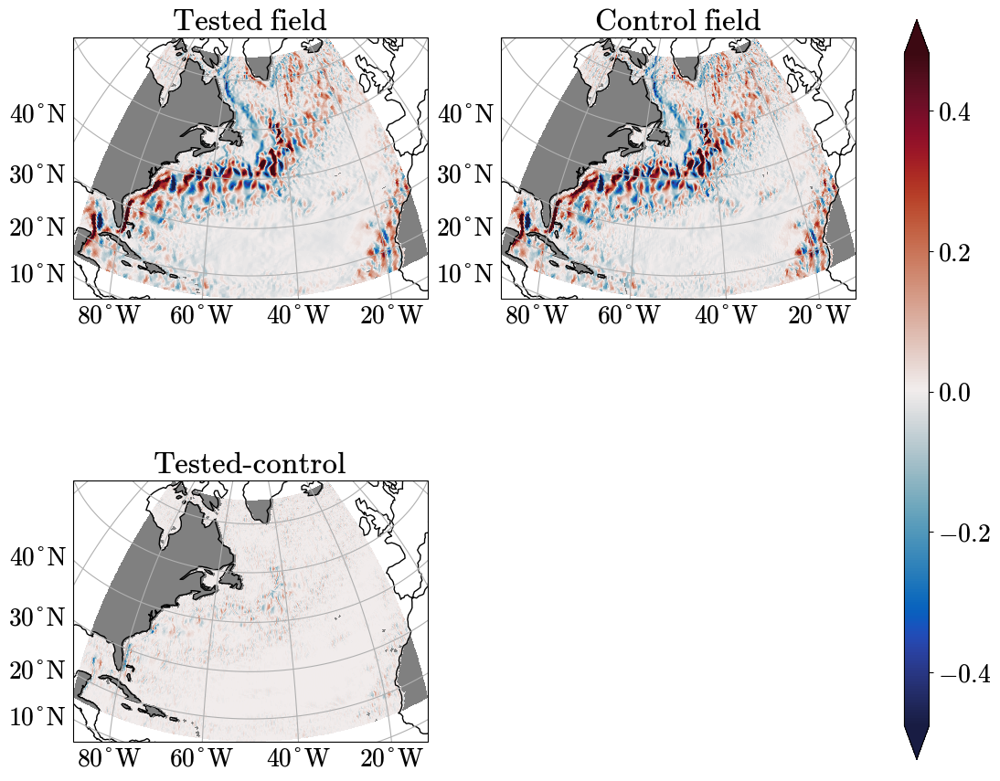

In [175]:
compare(ann_greene_vg[1].isel(time=364), ann_greene_v[1].isel(time=364))

Correlation: 0.9875349817699892
Relative Error: 0.1428770160990664
R2 =  0.9787199090475972
R2 max =  0.9846775335411265
Optinal scaling: 1.0843445123509772
Nans [test/control]: [21640, 21640]


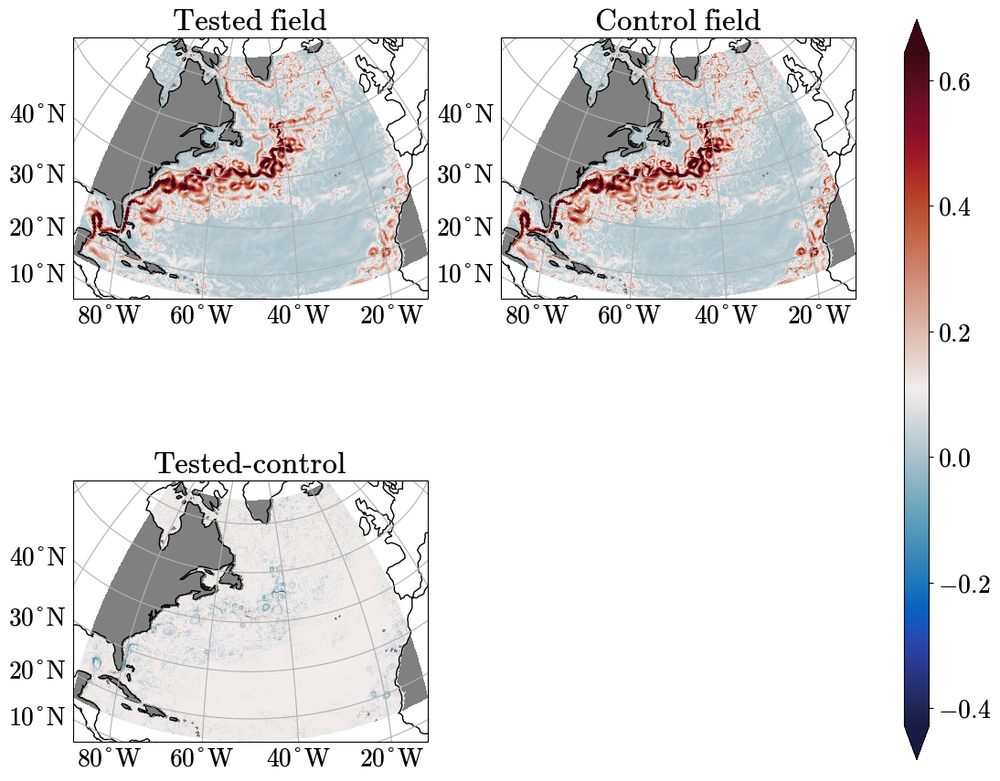

In [176]:
compare(ann_greene_vg[2].isel(time=364), ann_greene_v[2].isel(time=364))

Correlation: 0.7977291832255673
Relative Error: 0.6908596789138319
R2 =  0.6309668341486288
R2 max =  0.6401579692880169
Optinal scaling: 1.1435943855299229
Nans [test/control]: [21407, 21361]


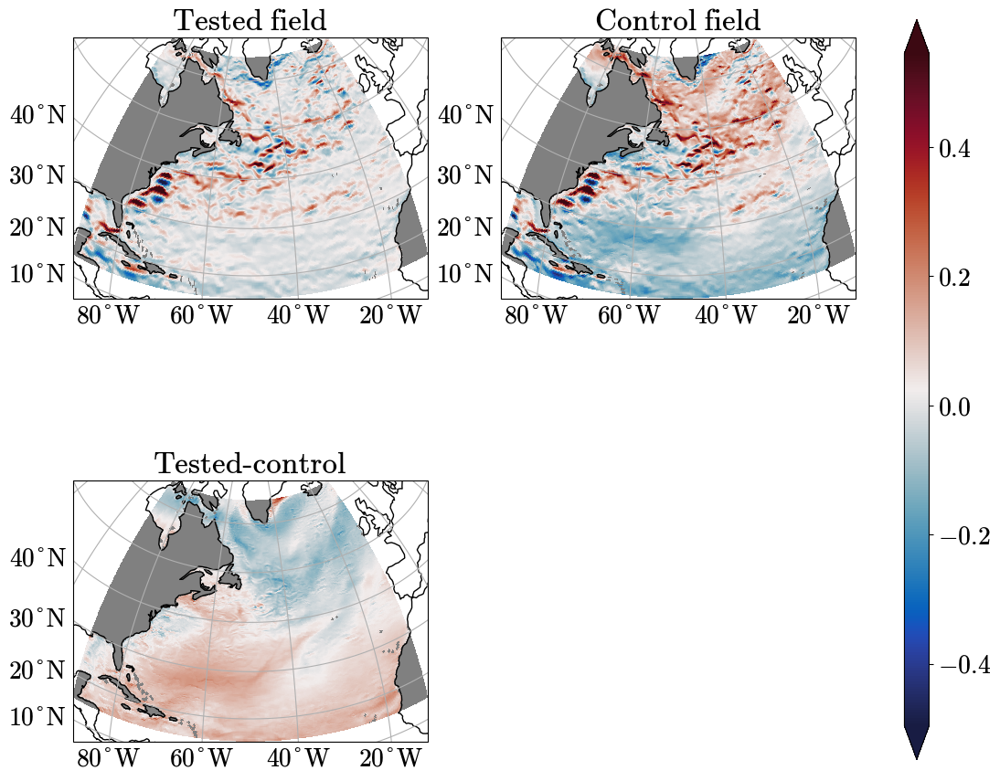

In [137]:
compare(om5_vg[0], om5_v[0])

Correlation: 0.797491553083847
Relative Error: 0.6764938162384044
R2 =  0.6191383968046122
R2 max =  0.6299182222920878
Optinal scaling: 1.159618878576203
Nans [test/control]: [21361, 21407]


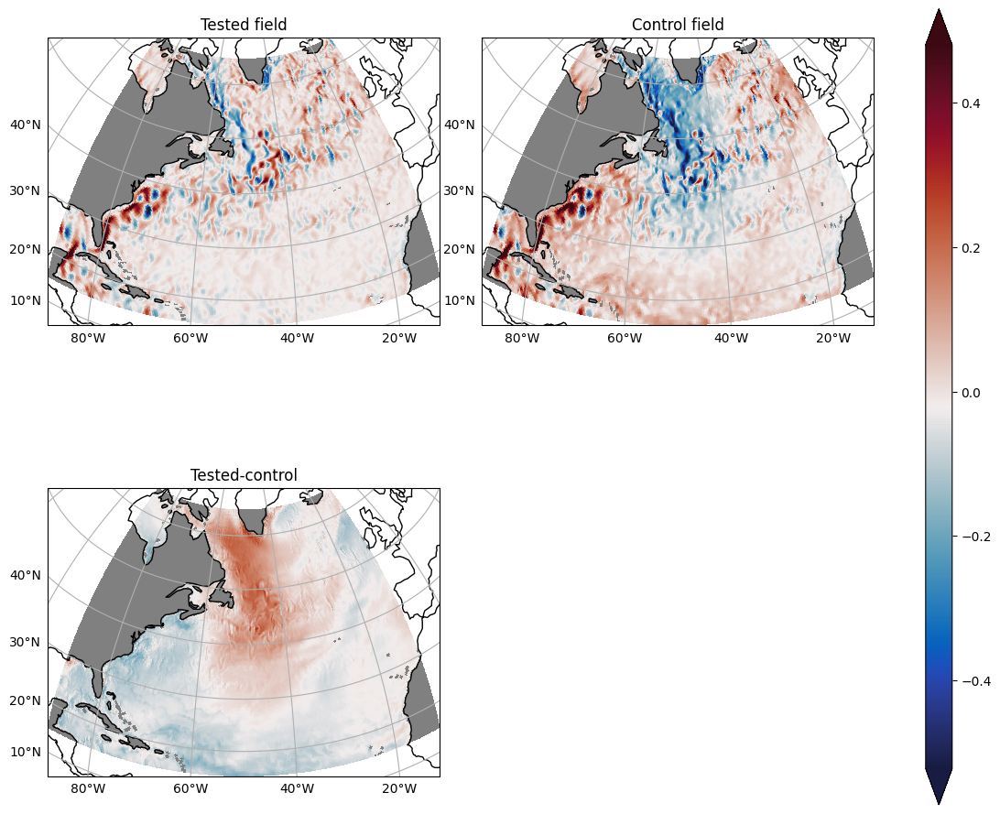

In [13]:
compare(om5_vg[1], om5_v[1])

Correlation: 0.8295098101664935
Relative Error: 0.47570835565236114
R2 =  0.7772393718699674
R2 max =  0.8206846099969892
Optinal scaling: 1.2988398938432133
Nans [test/control]: [21996, 21996]


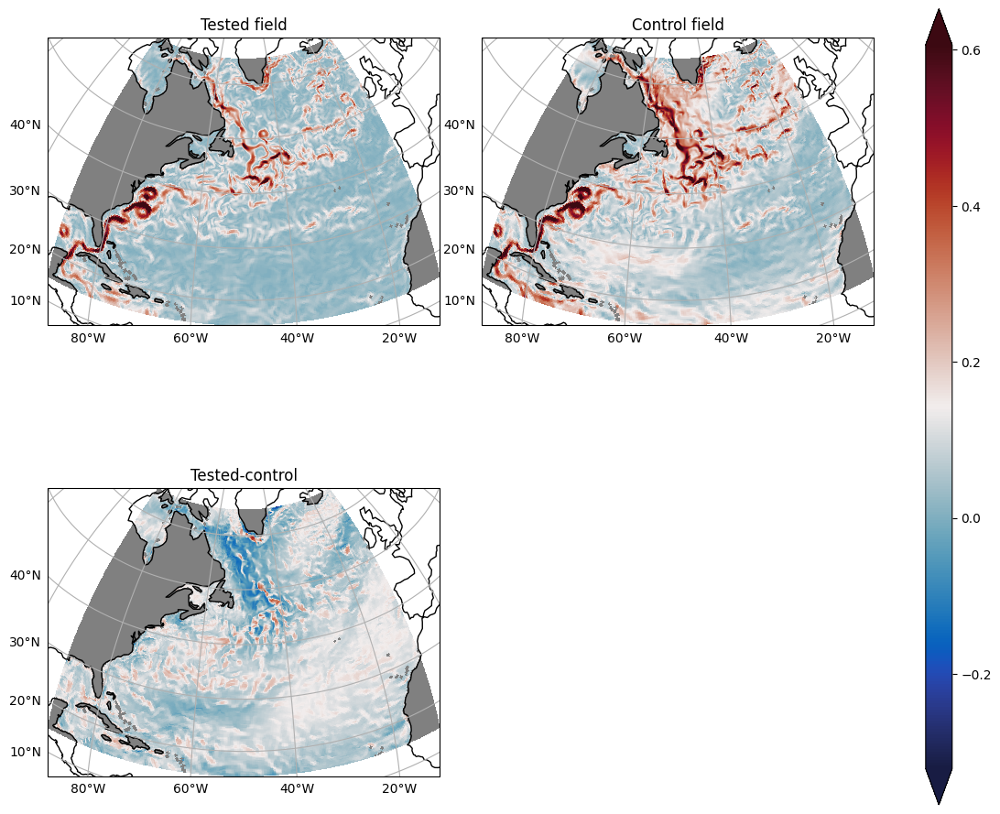

In [14]:
compare(om5_vg[2], om5_v[2])

Correlation: 0.8261096411391025
Relative Error: 0.6601812652510904
R2 =  0.6750429990413663
R2 max =  0.6794583020882246
Optinal scaling: 1.0951292278017952
Nans [test/control]: [21407, 21361]


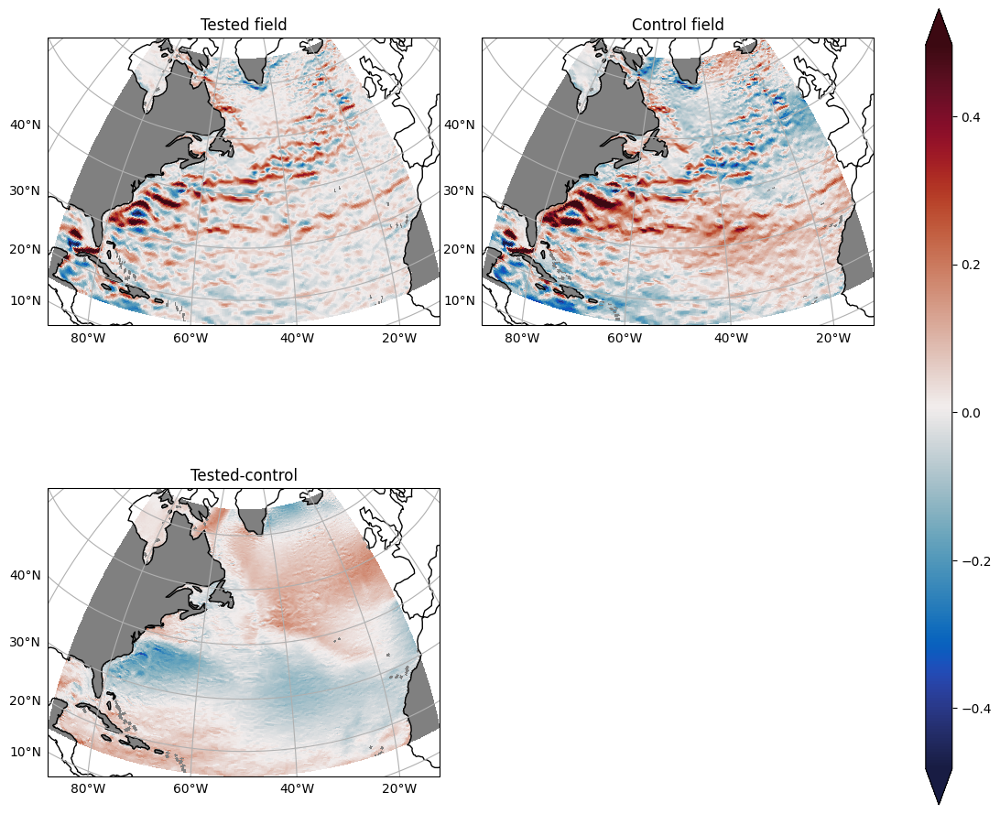

In [15]:
compare(ann_vg[0], ann_v[0])

Correlation: 0.5227065724625068
Relative Error: 0.2811656323428856
R2 =  0.8780007119515226
R2 max =  0.897680724635996
Optinal scaling: 0.8710309957453377
Nans [test/control]: [21996, 21996]


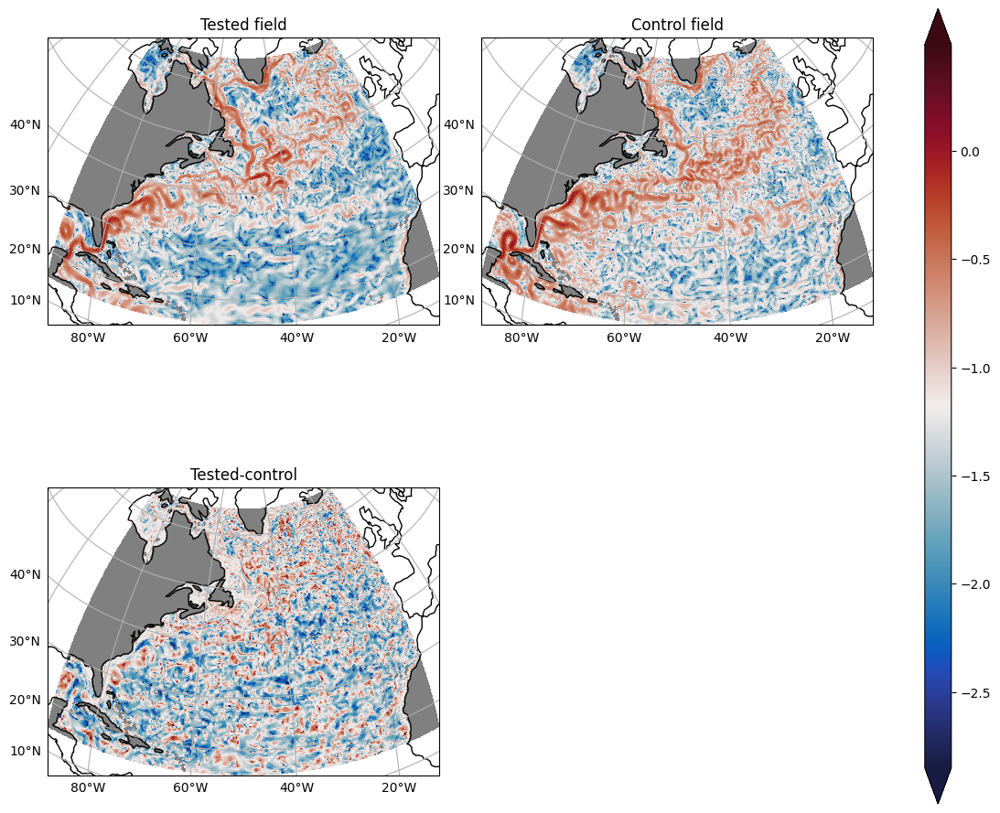

In [16]:
compare(np.log10(om5_vg[2].isel(time=4000)), np.log10(ann_vg[2].isel(time=4000)))

In [225]:
default_rcParams({'figure.subplot.wspace': 0.1, 'font.size': 20})
def plot_regions(idx=0, lat=slice(20,70), lon=slice(-90,0)):
    fig, axes = plt.subplots(1,3, figsize=(12, 4), 
    subplot_kw={'projection': ccrs.Orthographic(central_latitude=(lat.start+lat.stop)/2, central_longitude=(lon.start+lon.stop)/2)})
    
    time_idx=idx
    time_str = om5_zos.time.isel(time=time_idx).item().strftime('%Y-%m-%d')
    time_str_obs = np.datetime_as_string(obs_zos.time.isel(time=time_idx), unit='D')
    
    # My preset; Equivalent to plotting surface KE
    cmap = plt.get_cmap('inferno')
    norm = mpl.colors.LogNorm(vmin=0.05, vmax=1.5)
    cmap.set_bad('gray')
    
    ax = axes[0]
    ax.coastlines()
    ax.gridlines()
    im = om5_vg[2].isel(time=time_idx).sel(xh=lon, yh=lat).plot(
        ax=ax, transform=ccrs.PlateCarree(),
        norm=norm,
        cmap=cmap,
        add_colorbar=False
    )
    ax.set_title(f'OM5, $1/4^o$\n {time_str}', fontsize=15)

    ax = axes[1]
    ax.coastlines()
    ax.gridlines()
    im = ann_vg[2].isel(time=time_idx).sel(xh=lon, yh=lat).plot(
        ax=ax, transform=ccrs.PlateCarree(),
        norm=norm,
        cmap=cmap,
        add_colorbar=False
    )
    ax.set_title(f'ANN GFDL, $1/4^o$\n {time_str}', fontsize=15)
    
    ax = axes[2]
    ax.coastlines()
    ax.gridlines()
    im = obs_vg[2].isel(time=time_idx).sel(xh=lon, yh=lat).plot(
        ax=ax, transform=ccrs.PlateCarree(),
        norm=norm,
        cmap=cmap,
        add_colorbar=False
    )
    #ax.set_title(f'ANN Greene, $1/4^o$\n {time_str}', fontsize=15)
    ax.set_title(f'Altimetry\n {time_str_obs}', fontsize=15)


    cb = plt.colorbar(im, pad=0.02, ax=axes, extend='both', aspect=100, shrink=1.0, orientation='horizontal')
    cb.set_label(label='Surface geostrophic velocity, $\mathrm{m}/\mathrm{s}$')

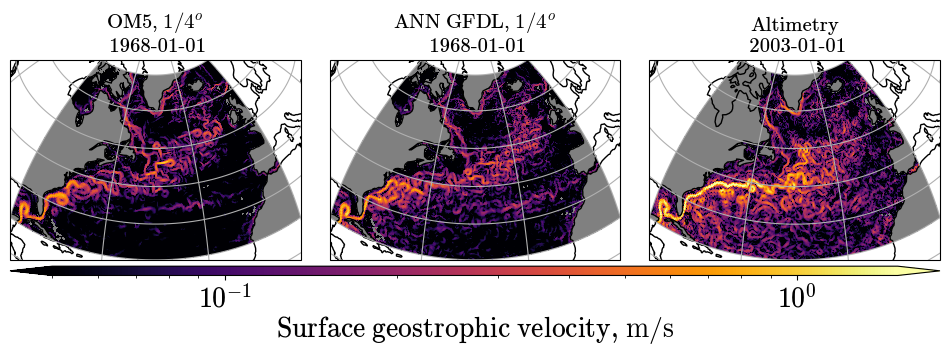

In [226]:
plot_regions(3652)

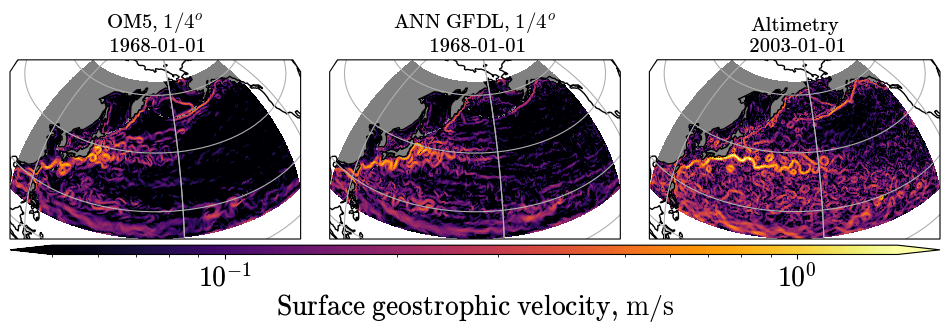

In [227]:
plot_Pacific = lambda idx: plot_regions(idx=idx, lat=slice(10,65), lon=slice(-250,-130))
plot_Pacific(3652)

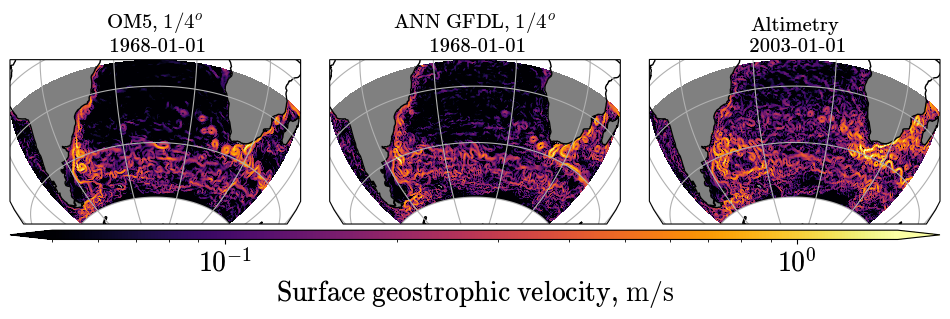

In [230]:
plot_rings = lambda idx: plot_regions(idx=idx, lat=slice(-60,-10), lon=slice(-80,50))
plot_rings(3652)

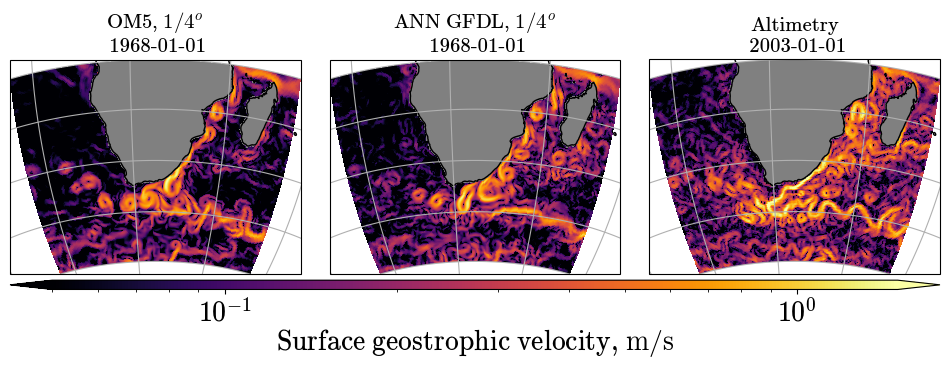

In [245]:
plot_rings_Africa = lambda idx: plot_regions(idx=idx, lat=slice(-50,-10), lon=slice(-5,55))
plot_rings_Africa(3652)

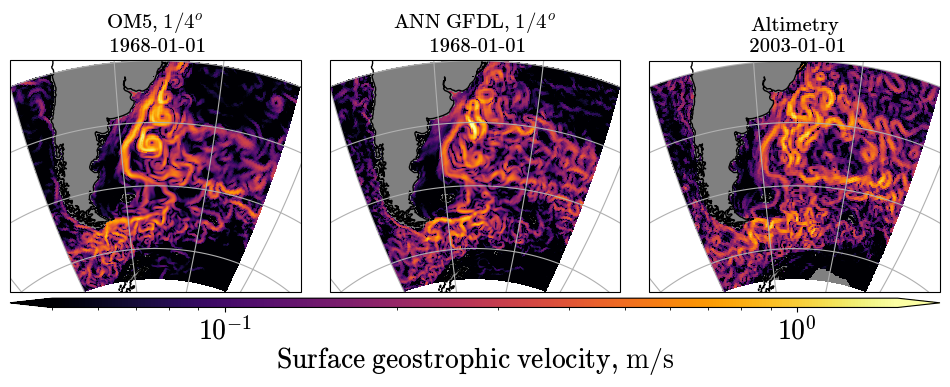

In [254]:
plot_rings_SA = lambda idx: plot_regions(idx=idx, lat=slice(-65,-30), lon=slice(-80,-25))
plot_rings_SA(3652)

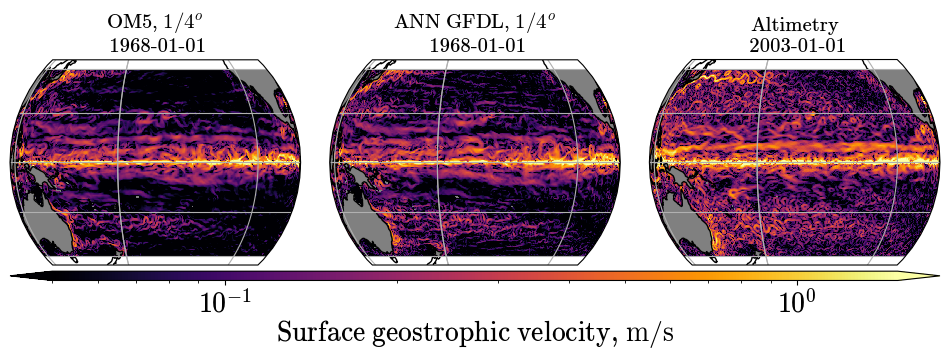

In [233]:
plot_equator = lambda idx: plot_regions(idx=idx, lat=slice(-40,40), lon=slice(-280,-50))
plot_equator(3652)

In [256]:
%%time
create_animation_ffmpeg(plot_rings_SA, range(3652,4383,3), 'ANN_May16_rings_SA_GFDL_1968_1969.mp4', dpi=200, FPS=20)

Native resolution of snapshots is used: 1900x7643

Animation ANN_May16_rings_SA_GFDL_1968_1969.mp4 at FPS=20 will last for 12.2 seconds. The frames are saved to 
.ffmpeg/ANN_May16_rings_SA_GFDL_1968_1969

Running the command:
cd /scratch/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/offline_analysis; ffmpeg -y -framerate 20 -i .ffmpeg/ANN_May16_rings_SA_GFDL_1968_1969/frame-%d.png -s:v 1900x764 -c:v libx264 -profile:v high -crf 20 -pix_fmt yuv420p ANN_May16_rings_SA_GFDL_1968_1969.mp4


sh: 1: module: not found
ffmpeg version 4.2.4-1ubuntu0.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.3.0-10ubuntu2)
  configuration: --prefix=/usr --extra-version=1ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --en

CPU times: user 6min 20s, sys: 3min 1s, total: 9min 21s
Wall time: 5min 58s


frame=  244 fps= 20 q=-1.0 Lsize=   12530kB time=00:00:12.05 bitrate=8518.2kbits/s speed=1.01x    
video:12526kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.030639%
[libx264 @ 0x562728663600] frame I:1     Avg QP:17.71  size:205618
[libx264 @ 0x562728663600] frame P:61    Avg QP:21.63  size:110665
[libx264 @ 0x562728663600] frame B:182   Avg QP:25.94  size: 32252
[libx264 @ 0x562728663600] consecutive B-frames:  0.4%  0.0%  1.2% 98.4%
[libx264 @ 0x562728663600] mb I  I16..4: 26.6% 33.4% 40.0%
[libx264 @ 0x562728663600] mb P  I16..4:  0.3%  3.5%  5.4%  P16..4:  7.7%  8.5% 11.0%  0.0%  0.0%    skip:63.6%
[libx264 @ 0x562728663600] mb B  I16..4:  0.2%  0.5%  0.4%  B16..8:  6.0%  2.9%  3.7%  direct:12.9%  skip:73.5%  L0:35.3% L1:32.8% BI:31.8%
[libx264 @ 0x562728663600] 8x8 transform intra:39.4% inter:42.3%
[libx264 @ 0x562728663600] coded y,uvDC,uvAC intra: 76.6% 77.1% 75.5% inter: 19.0% 20.9% 17.7%
[libx264 @ 0x562728663600] i16 v,h,dc,p: 46% 39% 15%  0

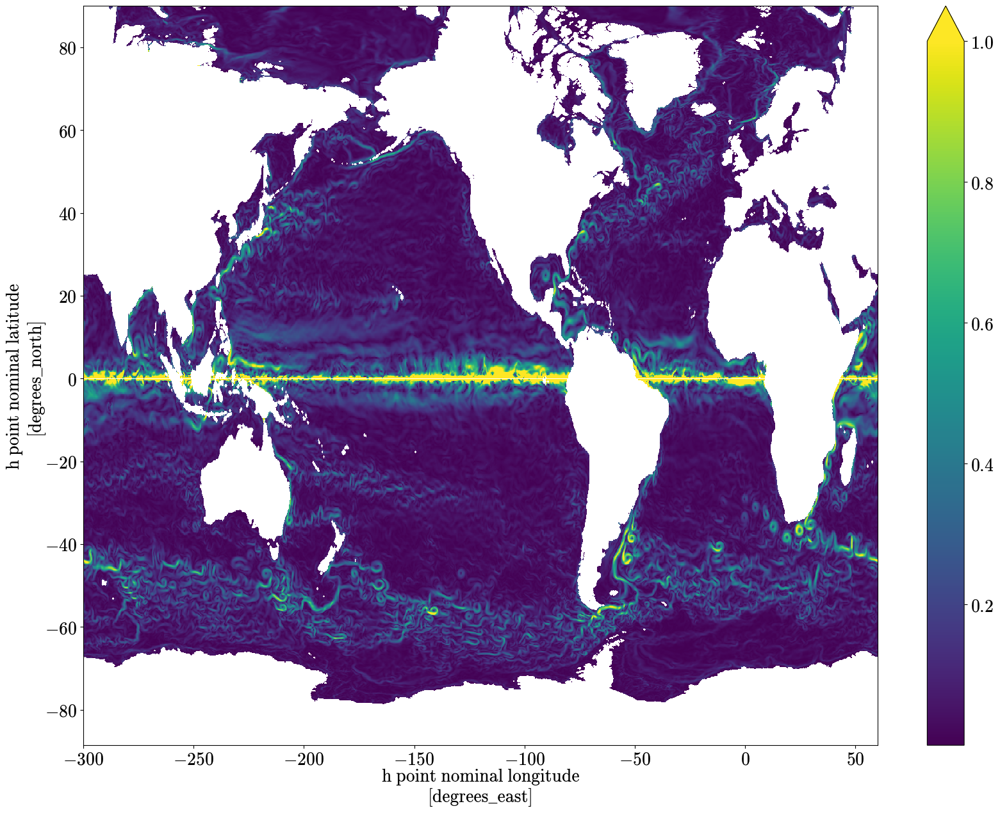

In [238]:
plt.figure(figsize=(20,15))
om5_vg[2].isel(time=4300).plot(vmax=1)

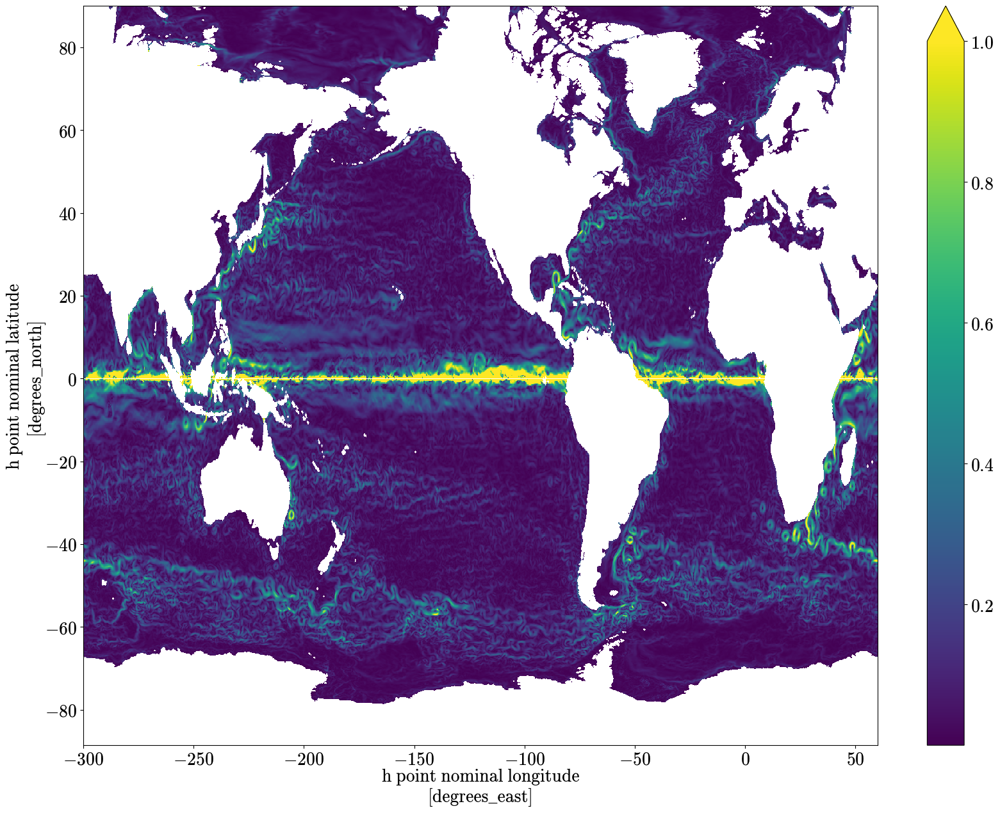

In [239]:
plt.figure(figsize=(20,15))
ann_vg[2].isel(time=4300).plot(vmax=1)